# Generative AI and Prompt Engineering
## A Program by IISc and TalentSprint
### Assignment 1: Stable Diffusion

## Learning Objectives

At the end of the experiment, you will be able to:

* understand the concept of diffusion models in general
* understand how does diffusion model works
* understand what is stable diffusion model and its components
* use the pre-trained stable diffusion model to generate images from the text prompt
* understand the different parameters to generate refined images

## What are Diffusion Models?

Diffusion Models are **generative** models, meaning that they are used to generate data similar to the data on which they are trained. Fundamentally, Diffusion Models work by **destroying training data** through the successive addition of Gaussian noise, and then **learning to recover** the data by *reversing* this noising process. After training, we can use the Diffusion Model to generate data by simply **passing randomly sampled noise through the learned denoising process**.

>Diffusion Models can be used to generate images from noise:
><img src='https://www.assemblyai.com/blog/content/images/2022/05/image-10.png' width=600px>

## How does it work?

>The image is asymptotically transformed to pure Gaussian noise. The **goal** of training a diffusion model is to learn the **reverse** process.
>
><img src='https://www.assemblyai.com/blog/content/images/size/w1000/2022/05/image.png' width=800px>

<br>

>By traversing backwards along this chain, we can generate new data.
>
><img src='https://www.assemblyai.com/blog/content/images/size/w1000/2022/05/image-1.png' width=800px>

## Stable Diffusion

**Diffusion models** are a class of generative models that simulate the process of data generation through a gradual diffusion process.

**Stable Diffusion**, on the other hand, is a specific implementation of a diffusion model developed for high-quality image generation. It enhances the standard diffusion model framework with techniques like latent space representation, allowing for more efficient processing and the generation of high-resolution images. Stable Diffusion also incorporates elements like conditioning on textual input, enabling it to create images based on textual descriptions.

>**More details:**
>
>Stable Diffusion is a deep learning model for image generation,
released in 2022. It is based on a particular type of diffusion model called `Latent Diffusion`, proposed in the paper [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/pdf/2112.10752.pdf). They are generative models, designed to  create new data similar to the data it was trained on. In the case of Stable Diffusion, the data is images and trained to reduce random Gaussian noise.
>
>The Stable Diffusion algorithm was developed by Compvis (the Computer Vision research group at the Ludwig Maximilian University of Munich) and sponsored primarily by the startup Stability AI.
>
>The algorithm is based on ideas from DALL-E 2 (developed by Open AI, which is also the creator of ChatGPT), Imagen (from Google), and others image generation models.

Types of image generation through diffusion models:

* **Unconditional image generation:** the model generates images without any additional condition like text or image. You will get images similar to those provided in the training set.

* The **generation of images conditioned** by text is known as `text-to-image`, or `text2img`. The prompt is converted into embeddings that are used to condition the model to
generate an image from noise.

* The **generation of images based on other image** is known as `image-to-image`, or `img2img`. In addition to the text prompt, it allows sending an initial image to condition the  generation of new images. You have more control over the final composition.

* **`Inpainting`** allows selecting a specific part of the image to change  the class/concept, or even  removing it from the scene.


### Main components of Stable diffusion

Main components include:

1. Autoencoder (VAE)
2. U-Net
3. Text-encoder
4. CLIP (Contrastive Language-Image Pre-training)

Figure below shows the conceptual diagram of stable diffusion architecture/inference steps:

<br>
<center>
<img src = "https://www.philschmid.de/_next/image?url=%2Fstatic%2Fblog%2Fstable-diffusion-inference-endpoints%2Fstable-diffusion.png&w=1080&q=75" width=700px/>
</center>

* Stable Diffusion receives a latent seed and a text prompt as input.
* The seed is used to generate random representations of
latent images of size 64x64.
* The text prompt is transformed into text embeddings of
size 77x768 using CLIP text encoder.
* U-Net iteratively reduces noise from the random latent
image representations while conditioning on the text
embeddings.
* The U-Net output (noise residual) is used to compute a
denoised latent image representation using a scheduler
algorithm.
* The denoising process is repeated $x$ times to recover the
best latent image representations.
* Once completed, the latent image representation is
decoded by the decoder part of the VAE (Variational Autoencoder).


## Parameters

There are many other parameters like `generator` that can be passed inside the `StableDiffusionPipeline` to improve the result.

For example:
- Inference steps (`num_inference_steps`)
- Guidance scale (`guidance_scale`)
- Image size (`height` and `width` dimensions)
- Negative prompt (`negative_prompt`)

#### **Inference steps (`num_inference_steps`)**

The more the steps, the better the results but the longer it takes to generate the image. It is also known as denoising steps, as it indicates the number of steps required to turn the image from complete noise (initial state) into the result.

* Stable Diffusion works very well with a relatively small number of steps, so we recommend using the default value of 50 inference steps. The more steps the better the result, but there comes a point where  the image stops improving.
* For faster results, use a smaller number.
* The defaut number of steps varies according to the scheduler algorithm

<br>

> **Variation in output due to Inference steps:**
> <br><br>
>
> <img src='https://drive.google.com/uc?id=1EXKDYNNhfIxl_KKZsErdiKa2D-KwVtqe' width=800px>

#### **Guidance scale (CFG)**

The classifier-free guidance (CFG - also known as guidance scale) is a way to increase the adherence to  the conditional prompt that guides the generation, as well as the overall quality of the image.
It controls how much the prompt will be taken into account for conditioning the diffusion process.

* **Smaller values:** the more the prompt is ignored. For example, if the value is set to 0 then the image
generation is unconditioned.
* **Higher values:** returns images that better represent the prompt



Choosing the best value

* Values between 7 and 8.5 are generally good choices. The default value is 7.5

* In general, you can keep the value in the range from 5 to 9. Less realistic images will be returned if the values are too low or too high

* The best value depends on the desired results and the complexity of the prompt

<br>

> **Variation in output due to Guidance scale (CFG):**
> <br><br>
>
> <img src='https://drive.google.com/uc?id=1NlLU4sylSGf9DfQjFQZ8Hi7zWzlL3Woa' width=800px>


#### **Image size (dimensions)**

The generated images are 512 x 512 pixels

Recommendations in case you want other dimensions:

* make sure the height and width are multiples of 8
* less than 512 will result in lower quality images
* exceeding 512 in both directions (width and height) will repeat areas of the image ("global coherence" is lost)

<br>

> **Variation in output due to Image Size:**
    > <br><br>
>
> <img src='https://drive.google.com/uc?id=1YAmUmN3fUC5uEP1vPwzJdR8YfVLkdFXh' width=800px>


#### **Negative prompt (`negative_prompt`)**

The negative prompt is an
additional way of telling what you
don't want in the image, what
you'd like to avoid.
* It could be used to remove objects
from the image or fix defects.
* It is optional in the first versions of
Stable Diffusion, however, in the
latest versions it has become
important to generate
quality images.
* Some images can only be
generated using negative prompts.

During the text-to-image conditioning step, the prompt is converted into embedding
vectors which will feed the U-Net noise predictor.
* There are two sets of embedding vectors: one for the positive prompt and one for the
negative prompt.
* Both the positive and negative prompts have 77 tokens.

<br>

> **Variation in output due to Negative prompts:**
> <br><br>
>
> <img src='https://drive.google.com/uc?id=1li7zVFvRkkLmoCU_SqRLCxJkCEtdTfdU' width=800px>


#### **Changing the Scheduler (Sampler)**

The model is usually not trained to directly predict a slightly less noisy image, but rather to predict the '***noise residual***' which is the difference between a less noisy image and the input image or, similarly, the gradient between the two time steps.

To do the denoising process, a specific ***noise scheduling algorithm*** is thus necessary and "wrap" the model to define how many diffusion steps are needed for inference as well as how to *compute* a less noisy image from the model's output. Here is where the different ***schedulers*** of the diffusers library come into play.

Scheduler algorithms (also called samplers) calculates the predicted denoised image  representation from the previous noise representation and the predicted noise residual. Determines how the image is calculated. There are several different algorithms.

Some examples commonly used with Stable Diffusion :

* PNDM (default)
* DDIM Scheduler
* K-LMS Scheduler
* Euler Ancestral Discrete Scheduler (Euler A)
* DPM Scheduler

***Since these samplers are different mathematically, they will diverge and can eventually converge if the settings correct.***


<br>

> **Variation in output due to different Samplers:**
> <br><br>
>
> <img src='https://drive.google.com/uc?id=1J1nlw3NKU513CijPF9ijUp3rfWjL85PO' width=800px>


For technical details on theory and mathematics of the scheduler algorithms, refer to [this](https://arxiv.org/abs/2206.00364) paper: Elucidating the Design Space of Diffusion-Based Generative Models.

For comparison of different samplers, refer [here](https://www.artstation.com/blogs/kaddoura/pBPo/stable-diffusion-samplers).

To know more about available schedulers on HuggingFace, refer [here](https://huggingface.co/docs/diffusers/using-diffusers/schedulers#schedulers-summary).

Default is [PNDMScheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py).


### Setup Steps:

In [1]:
#@title Please enter your registration id to start: { run: "auto", display-mode: "form" }
Id = "2416549" #@param {type:"string"}

In [44]:
#@title Please enter your password (your registered phone number) to continue: { run: "auto", display-mode: "form" }
password = "9149356263" #@param {type:"string"}

In [45]:
#@title Run this cell to complete the setup for this Notebook
from IPython import get_ipython

ipython = get_ipython()

notebook= "M4_AST_01_StableDiffusion_B" #name of the notebook

def setup():
#  ipython.magic("sx pip3 install torch")
    from IPython.display import HTML, display
    display(HTML('<script src="https://dashboard.talentsprint.com/aiml/record_ip.html?traineeId={0}&recordId={1}"></script>'.format(getId(),submission_id)))
    print("Setup completed successfully")
    return

def submit_notebook():
    ipython.magic("notebook -e "+ notebook + ".ipynb")

    import requests, json, base64, datetime

    url = "https://dashboard.talentsprint.com/xp/app/save_notebook_attempts"
    if not submission_id:
      data = {"id" : getId(), "notebook" : notebook, "mobile" : getPassword()}
      r = requests.post(url, data = data)
      r = json.loads(r.text)

      if r["status"] == "Success":
          return r["record_id"]
      elif "err" in r:
        print(r["err"])
        return None
      else:
        print ("Something is wrong, the notebook will not be submitted for grading")
        return None

    elif getAnswer() and getComplexity() and getAdditional() and getConcepts() and getComments() and getMentorSupport():
      f = open(notebook + ".ipynb", "rb")
      file_hash = base64.b64encode(f.read())

      data = {"complexity" : Complexity, "additional" :Additional,
              "concepts" : Concepts, "record_id" : submission_id,
              "answer" : Answer, "id" : Id, "file_hash" : file_hash,
              "notebook" : notebook,
              "feedback_experiments_input" : Comments,
              "feedback_mentor_support": Mentor_support}
      r = requests.post(url, data = data)
      r = json.loads(r.text)
      if "err" in r:
        print(r["err"])
        return None
      else:
        print("Your submission is successful.")
        print("Ref Id:", submission_id)
        print("Date of submission: ", r["date"])
        print("Time of submission: ", r["time"])
        print("View your submissions: https://genai-iisc.talentsprint.com/notebook_submissions")
        #print("For any queries/discrepancies, please connect with mentors through the chat icon in LMS dashboard.")
        return submission_id
    else: submission_id


def getAdditional():
  try:
    if not Additional:
      raise NameError
    else:
      return Additional
  except NameError:
    print ("Please answer Additional Question")
    return None

def getComplexity():
  try:
    if not Complexity:
      raise NameError
    else:
      return Complexity
  except NameError:
    print ("Please answer Complexity Question")
    return None

def getConcepts():
  try:
    if not Concepts:
      raise NameError
    else:
      return Concepts
  except NameError:
    print ("Please answer Concepts Question")
    return None


# def getWalkthrough():
#   try:
#     if not Walkthrough:
#       raise NameError
#     else:
#       return Walkthrough
#   except NameError:
#     print ("Please answer Walkthrough Question")
#     return None

def getComments():
  try:
    if not Comments:
      raise NameError
    else:
      return Comments
  except NameError:
    print ("Please answer Comments Question")
    return None


def getMentorSupport():
  try:
    if not Mentor_support:
      raise NameError
    else:
      return Mentor_support
  except NameError:
    print ("Please answer Mentor support Question")
    return None

def getAnswer():
  try:
    if not Answer:
      raise NameError
    else:
      return Answer
  except NameError:
    print ("Please answer Question")
    return None


def getId():
  try:
    return Id if Id else None
  except NameError:
    return None

def getPassword():
  try:
    return password if password else None
  except NameError:
    return None

submission_id = None
### Setup
if getPassword() and getId():
  submission_id = submit_notebook()
  if submission_id:
    setup()
else:
  print ("Please complete Id and Password cells before running setup")

Setup completed successfully


## Installing the libraries

- [xformers](https://github.com/facebookresearch/xformers) for memory optimization



In [4]:
!pip install -q diffusers==0.11.1
!pip install -q accelerate transformers ftfy bitsandbytes==0.35.0 gradio natsort safetensors xformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.0/43.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.7/318.7 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.6/94.6 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.9/141.9 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 70.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/

### Import required packages

In [5]:
from PIL import Image
import matplotlib.pyplot as plt

import torch    #PyTorch
import jax
jax.random.KeyArray = jax.Array           # since jax.random.KeyArray is deprecated
from diffusers import StableDiffusionPipeline

import warnings
warnings.filterwarnings("ignore")

# 1.Models

## CompVis/stable-diffusion-v1-4

- We can define with little effort a pipeline to use the Stable Diffusion model, through the [StableDiffusionPipeline](https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py).

- The checkpoint used here is the [`'CompVis/stable-diffusion-v1-4'`](https://huggingface.co/CompVis/stable-diffusion-v1-4)

In [6]:
# Load SDv1.4
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")
pipe = pipe.to('cuda')  # Use GPU

# Memory optimization, specially on colab
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

text_encoder/pytorch_model.fp16.safetensors not found


Fetching 30 files:   0%|          | 0/30 [00:00<?, ?it/s]

pytorch_model.fp16.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.non_ema.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

(…)fusion_pytorch_model.non_ema.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


## runwayml/stable-diffusion-v1-5

In [9]:
# Load SDv1.5
sd15 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
sd15 = sd15.to('cuda')
sd15.enable_attention_slicing()
sd15.enable_xformers_memory_efficient_attention()

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

text_encoder/pytorch_model.fp16.safetensors not found


Fetching 29 files:   0%|          | 0/29 [00:00<?, ?it/s]

pytorch_model.fp16.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

pytorch_model.fp16.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.non_ema.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

(…)fusion_pytorch_model.non_ema.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

## stabilityai/stable-diffusion-2-1

In [ ]:
# sd2 = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1")
# sd2 = sd2.to("cuda")
# sd2.enable_attention_slicing()
# sd2.enable_xformers_memory_efficient_attention()

## nitrosocke/mo-di-diffusion

Modern Disney style- https://huggingface.co/nitrosocke/mo-di-diffusion

In [ ]:
# modi = StableDiffusionPipeline.from_pretrained("nitrosocke/mo-di-diffusion")
# modi = modi.to("cuda")
# modi.enable_attention_slicing()
# modi.enable_xformers_memory_efficient_attention()

# 2.Image Generation

## Single Image Generation

In [7]:
prompt = 'a tiger standing on grass land'

  0%|          | 0/50 [00:00<?, ?it/s]

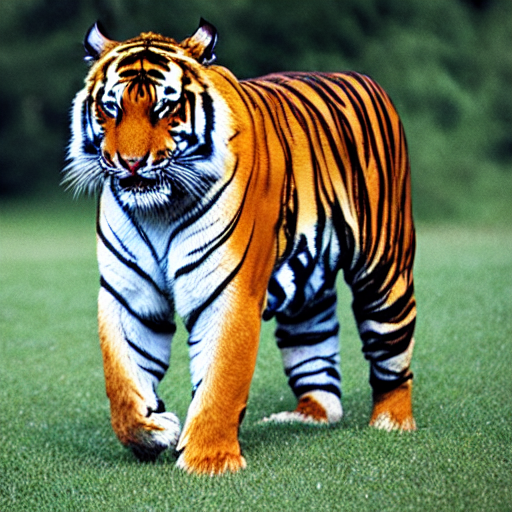

In [8]:
img = pipe(prompt).images[0]
img

## Multiple Images

In [10]:
num_imgs = 3
prompt = 'photograph of a royal enfield'

In [11]:
imgs = pipe(prompt, num_images_per_prompt= num_imgs).images

  0%|          | 0/50 [00:00<?, ?it/s]

**Function to plot multiple images**

In [12]:
# Function for plotting multiple images as one

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w * scale), int(h * scale) # reduce the size : when s<1 ; 0.75 * 512 = 384

  grid = Image.new('RGB', size = (cols * w, rows * h)) # creating gird (like blank canvas)
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs): # looping throuhg images
    img = img.resize((w, h), Image.Resampling.LANCZOS) # second parameter preserve the image appearance
    grid.paste(img, box=(i % cols * w, i // cols * h)) # pasting the image on grids

  return grid

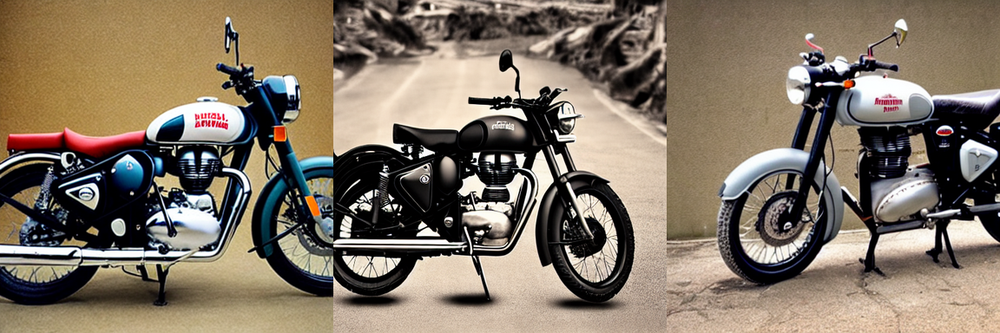

In [13]:
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

## Same Image on every run

In [14]:
# Set the seed value to generate same image for same input prompts
seed = 777
generator = torch.Generator('cuda').manual_seed(seed)

In [15]:
prompt = "photograph of a royal enfield'"
num_imgs = 3

  0%|          | 0/50 [00:00<?, ?it/s]

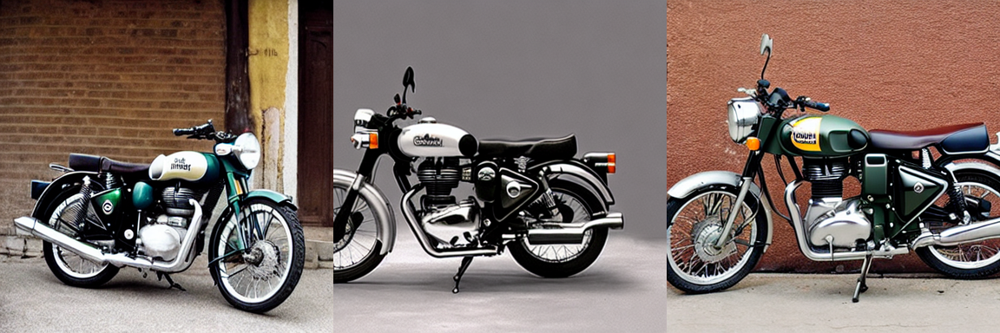

In [16]:
imgs = pipe(prompt, num_images_per_prompt=num_imgs, generator=generator).images
grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
grid

In [ ]:
### This code cell uses Modern-Disney Stable diffusion
### Restart the runtime and load "nitrosocke/mo-di-diffusion" pipeline ro run this cell.


# prompt = ["albert einstein, modern disney style",
#           "modern disney style rolls-royce in the desert, golden hour",
#           "modern disney style helicopter"]

# seed = 42
# print("Seed: ".format(str(seed)))
# generator = torch.Generator("cuda").manual_seed(seed)
# imgs = modi(prompt, generator=generator).images

# grid = grid_img(imgs, rows=1, cols=3, scale=0.75)
# grid

# 3.Tuning Parameters

## Inference Steps

In [17]:
prompt = "a photograph of an astronaut riding a horse"
seed = 1234 #It is not mandatory to change the seed, you can use the same seed through out
generator = torch.Generator("cuda").manual_seed(seed)
num_inference_steps = 20

  0%|          | 0/20 [00:00<?, ?it/s]

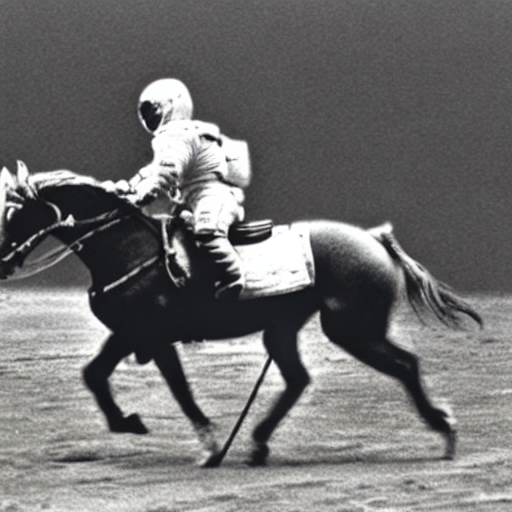

In [18]:
img = pipe(prompt, num_inference_steps=num_inference_steps, generator=generator).images[0]
img

**Multiple Inference steps**

In [19]:
num_inference_steps_lst = [10,20,30,40,50]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

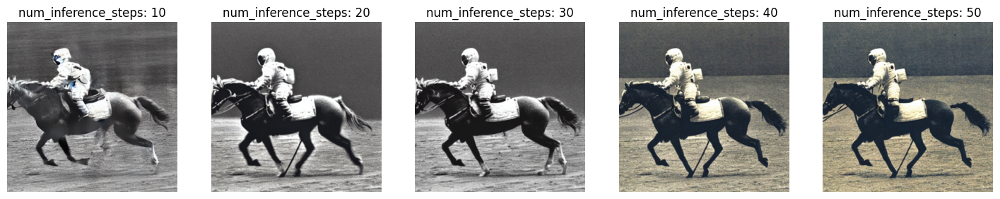

In [20]:
plt.figure(figsize=(18,8))
for i in range(len(num_inference_steps_lst)):
    n_steps = num_inference_steps_lst[i]
    generator = torch.Generator('cuda').manual_seed(seed)
    img = pipe(prompt, num_inference_steps=n_steps, generator=generator).images[0]

    plt.subplot(1, 5, i+1)
    plt.title('num_inference_steps: {}'.format(n_steps))
    plt.imshow(img)
    plt.axis('off')
plt.show()

## Guidance scale (CFG)

In [21]:
prompt = "a photograph of an astronaut riding a horse"
seed = 1234 #It is not mandatory to change the seed, you can use the same seed through out
generator = torch.Generator("cuda").manual_seed(seed)
guidance_scale = 10

  0%|          | 0/50 [00:00<?, ?it/s]

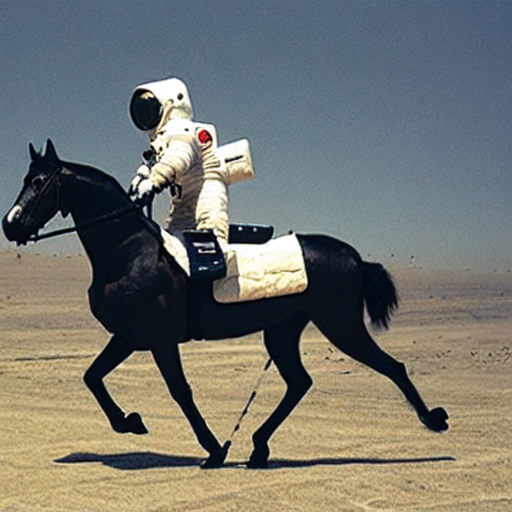

In [22]:
img = pipe(prompt, guidance_scale=guidance_scale, generator=generator).images[0]
img

**Multiple CFG values**

In [23]:
guidance_scale_lst = [5,6,7,8,9]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

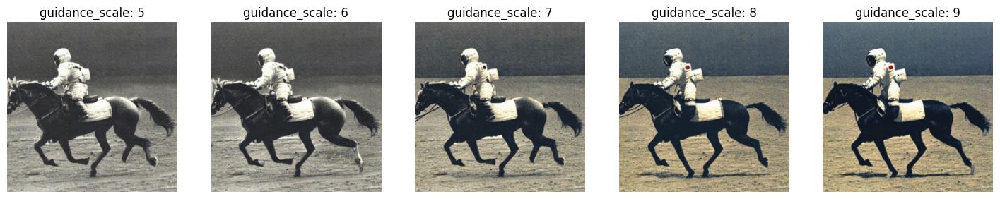

In [24]:
plt.figure(figsize=(18,8))

for i in range(len(guidance_scale_lst)):
    n_guidance = guidance_scale_lst[i]
    generator = torch.Generator("cuda").manual_seed(seed)
    img = pipe(prompt, guidance_scale=n_guidance, generator=generator).images[0]

    plt.subplot(1, 5, i+1)
    plt.title('guidance_scale: {}'.format(n_guidance))
    plt.imshow(img)
    plt.axis('off')

plt.show()

## Image Dimensions

> **Landscape mode**

In [25]:
seed = 777
prompt = "photograph of a mountain landscape during sunset, stars in the sky"
generator = torch.Generator("cuda").manual_seed(seed)
h, w = 512, 768

  0%|          | 0/50 [00:00<?, ?it/s]

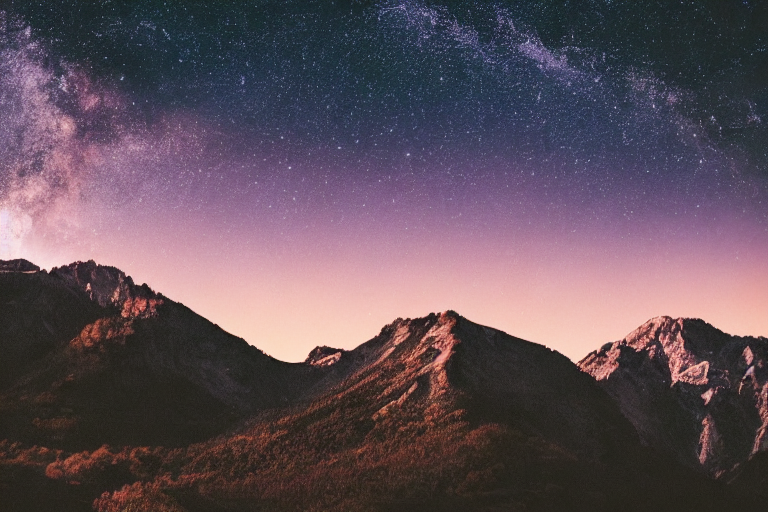

In [26]:
img = pipe(prompt, height=h, width=w, generator=generator).images[0]
img

> **Portrait mode**

In [27]:
generator = torch.Generator("cuda").manual_seed(seed)
h, w = 768, 512

  0%|          | 0/50 [00:00<?, ?it/s]

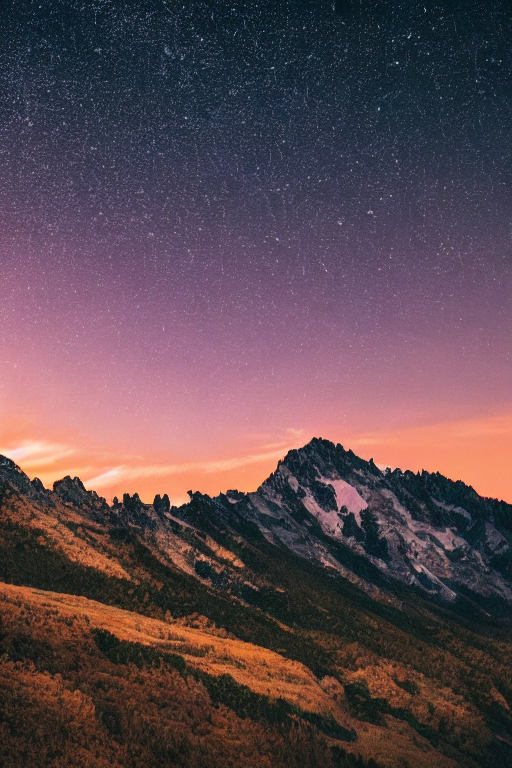

In [28]:
img = pipe(prompt, height=h, width=w, generator=generator).images[0]
img

## Negative Prompt

In [29]:
num_images = 3
prompt = 'photograph of an old car'
neg_prompt = 'bw photo'                  # black and white photo

  0%|          | 0/50 [00:00<?, ?it/s]

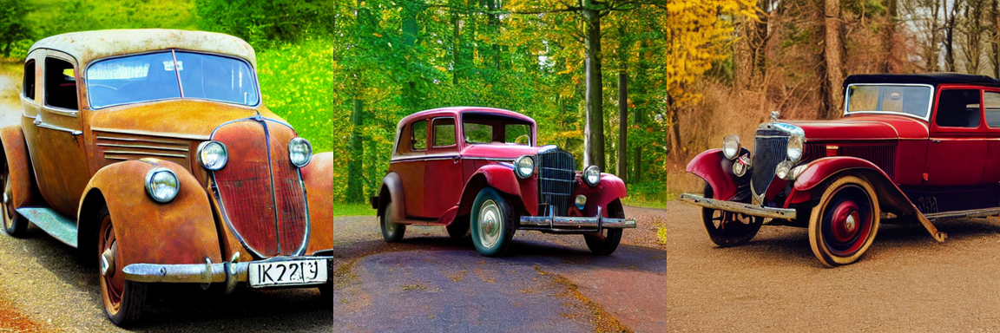

In [30]:
imgs = pipe(prompt, negative_prompt = neg_prompt, num_images_per_prompt= num_images).images
grid = grid_img(imgs, rows= 1, cols= 3, scale=0.75)
grid

## Changing the Scheduler

In [31]:
# Displaying the scheduler attributes
sd15.scheduler

PNDMScheduler {
  "_class_name": "PNDMScheduler",
  "_diffusers_version": "0.11.1",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "clip_sample": false,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "set_alpha_to_one": false,
  "skip_prk_steps": true,
  "steps_offset": 1,
  "trained_betas": null
}

In [32]:
# Getting other compatible scheduler with the algorithm
sd15.scheduler.compatibles

[diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_lms_discrete.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_pndm.PNDMScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler]

In [33]:
# Checking the current config
sd15.scheduler.config

FrozenDict([('num_train_timesteps', 1000),
            ('beta_start', 0.00085),
            ('beta_end', 0.012),
            ('beta_schedule', 'scaled_linear'),
            ('trained_betas', None),
            ('skip_prk_steps', True),
            ('set_alpha_to_one', False),
            ('prediction_type', 'epsilon'),
            ('steps_offset', 1),
            ('_class_name', 'PNDMScheduler'),
            ('_diffusers_version', '0.11.1'),
            ('clip_sample', False)])

In [34]:
# Changing the scheduler to DDIMScheduler

from diffusers import DDIMScheduler
sd15.scheduler = DDIMScheduler.from_config(sd15.scheduler.config)

  0%|          | 0/50 [00:00<?, ?it/s]

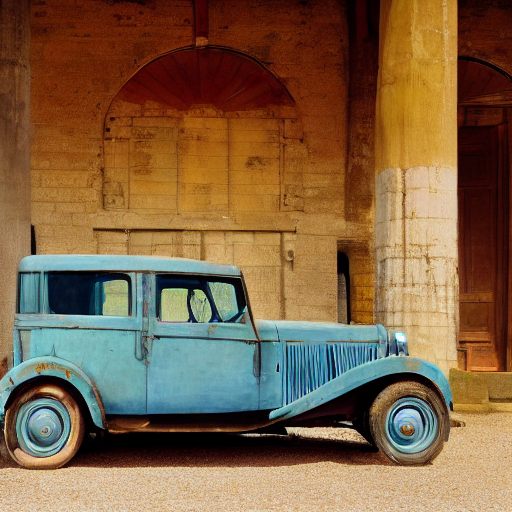

In [35]:
generator = torch.Generator(device = 'cuda').manual_seed(seed)
img = sd15(prompt, negative_prompt=neg_prompt, generator=generator).images[0]
img

### **NOTE**:
It is important to check the license of the models, especially if you intend to make some commercial use with the obtained results.

1. You can't use the model to deliberately produce nor share illegal or harmful outputs or content,
2. We claim no rights on the outputs you generate, you are free to use them and are accountable for their use which should not go against the provisions set in the license, and
3. You may re-distribute the weights and use the model commercially and/or as a service. If you do, please be aware you have to include the same use restrictions as the ones in the license and share a copy of the CreativeML OpenRAIL-M to all your users.
```
(Licence of v1.4 e v1.5 https://huggingface.co/spaces/CompVis/stable-diffusion-license)


### References:

1. [How diffusion models work: the math from scratch](https://theaisummer.com/diffusion-models/)

2. [The Illustrated Stable Diffusion](https://jalammar.github.io/illustrated-stable-diffusion/)

3. [Stable Diffusion using diffusers](https://www.cnblogs.com/flyingsir/p/17175876.html)

4. [Stable Diffusion Paper](https://arxiv.org/abs/2112.10752) - High-Resolution Image Synthesis with Latent Diffusion Models

5. [DreamBooth Paper](https://arxiv.org/pdf/2208.12242.pdf) - DreamBooth: Fine Tuning Text-to-Image Diffusion Models for Subject-Driven Generation
6. [Imagen Paper](https://arxiv.org/pdf/2205.11487.pdf)
7. [Classifier-Free Diffusion Guidance Paper](https://arxiv.org/pdf/2207.12598.pdf)
8. [Generating images with Stable Diffusion](https://blog.paperspace.com/generating-images-with-stable-diffusion/)

9. [DreamBooth](https://huggingface.co/docs/diffusers/training/dreambooth)
10. [Stable Diffusion prompt: a definitive guide](https://stable-diffusion-art.com/prompt-guide/)
11. [Text-guided image-to-image generation](https://huggingface.co/docs/diffusers/using-diffusers/img2img)

### Please answer the questions below to complete the experiment:




In [36]:
#@title Select the True statement w.r.t Stable Diffusion: { run: "auto", form-width: "500px", display-mode: "form" }
Answer = "Scheduler algorithms calculates the predicted noisy image representation from the previous denoised representation and the predicted noise residual" #@param ["", "Number of inference steps does not varies according to the scheduler algorithm", "Smaller the value of guidance scale, more the prompt is ignored", "Scheduler algorithms calculates the predicted noisy image representation from the previous denoised representation and the predicted noise residual", "The negative prompt is a way of telling what must be kept in the image while generation"]

In [37]:
#@title How was the experiment? { run: "auto", form-width: "500px", display-mode: "form" }
Complexity = "Good and Challenging for me" #@param ["","Too Simple, I am wasting time", "Good, But Not Challenging for me", "Good and Challenging for me", "Was Tough, but I did it", "Too Difficult for me"]


In [38]:
#@title If it was too easy, what more would you have liked to be added? If it was very difficult, what would you have liked to have been removed? { run: "auto", display-mode: "form" }
Additional = "." #@param {type:"string"}


In [39]:
#@title Can you identify the concepts from the lecture which this experiment covered? { run: "auto", vertical-output: true, display-mode: "form" }
Concepts = "Yes" #@param ["","Yes", "No"]


In [40]:
#@title  Text and image description/explanation and code comments within the experiment: { run: "auto", vertical-output: true, display-mode: "form" }
Comments = "Somewhat Useful" #@param ["","Very Useful", "Somewhat Useful", "Not Useful", "Didn't use"]


In [41]:
#@title Mentor Support: { run: "auto", vertical-output: true, display-mode: "form" }
Mentor_support = "Somewhat Useful" #@param ["","Very Useful", "Somewhat Useful", "Not Useful", "Didn't use"]


In [46]:
#@title Run this cell to submit your notebook for grading { vertical-output: true }
try:
  if submission_id:
      return_id = submit_notebook()
      if return_id : submission_id = return_id
  else:
      print("Please complete the setup first.")
except NameError:
  print ("Please complete the setup first.")

Your submission is successful.
Ref Id: 1933
Date of submission:  28 Sep 2024
Time of submission:  16:05:14
View your submissions: https://genai-iisc.talentsprint.com/notebook_submissions
